In [1]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator
import numpy as np
from matplotlib import animation
import cv2
from scipy.interpolate import LinearNDInterpolator
import h5py
from scipy.signal import convolve2d, medfilt2d
from scipy.interpolate import CloughTocher2DInterpolator
from wave_prop_module import Wave2d

In [2]:
6.45*1e-3 * 1040/2, 2*np.pi/0.5328, 650*1e-6/(2*np.sin(np.arctan(4.3/210))), 1392*0.00645*0.5

(3.354, 11.792765216177902, 0.0158754200555099, 4.4892)

## Synthetic signal for validation of method implementation

In [3]:
# # 2d gaussian intensity and unifrom phase as synthetic input

# numPx = [256, 256]
# sizePx = [0.02, 0.02]

# # Generating 2D grids 'x' and 'y' using meshgrid with 10 evenly spaced points from -1 to 1
# x, y = np.meshgrid(np.linspace(-1*numPx[0]*sizePx[0]/2, 1*numPx[0]*sizePx[0]/2, numPx[0]), 
#                    np.linspace(-1*numPx[1]*sizePx[1]/2, 1*numPx[1]*sizePx[1]/2, numPx[1]))

# # Calculating the Euclidean distance 'd' from the origin using the generated grids 'x' and 'y'
# d = np.sqrt(x*x + y*y)

# # Defining parameters sigma and mu for a Gaussian-like distribution
# sigma, mu = 1.0, 0.0

# # Calculating the Gaussian-like distribution 'g' based on the distance 'd', sigma, and mu
# g_int = np.exp(-((d - mu)**2 / (2.0 * sigma**2)))

# plt.imshow(g_int)
# plt.colorbar()
# plt.title("Amplitude")
# plt.show()

# g_phase = d < 2
# plt.imshow(g_phase)
# plt.title("Phase")
# plt.colorbar()
# plt.show()

# gaussian_field = g_int*np.exp(1j*g_phase*1e-6)
# gaussian_field.dtype

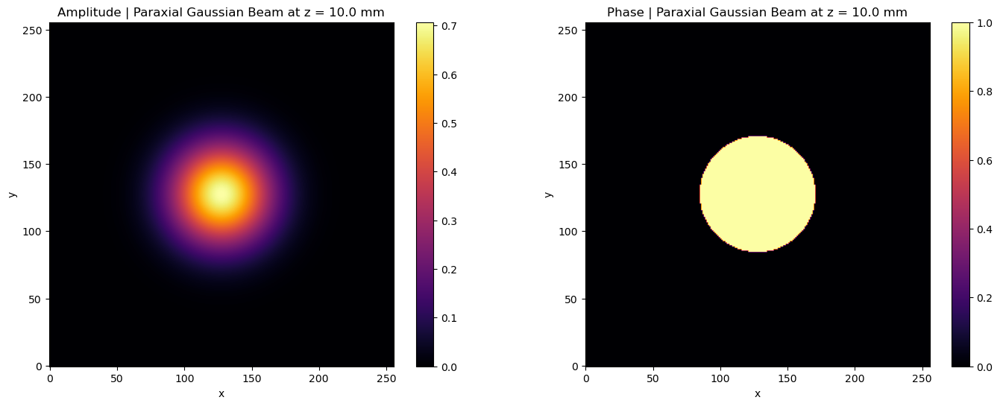

In [4]:
# generating a gaussian beam

def gaussian_beam(x, y, wavelength, waist_size, z, phase=0):
    k = 2 * np.pi / wavelength
    zR = np.pi * waist_size**2 / wavelength
    w_z = waist_size * np.sqrt(1 + (z / zR)**2)
    R_z = z * (1 + (zR / z)**2)
    gouy_phase = np.arctan(z / zR)
    
    w_0 = waist_size / np.sqrt(2)
    # phase_term = np.exp(1j * (k * z - k * x**2 / (2 * R_z) - gouy_phase + phase))
    thresh = x**2 + y**2 < waist_size
    phase_term = np.exp(1j * 1 * thresh)

    
    return (w_0 / w_z) * np.exp(-((x**2 + y**2) / w_z**2)) * phase_term

# Parameters
wl = 650*1e-6  # wavelength (in mm)
numPx = [256, 256]
sizePx = [0.02, 0.02]
waist_size = 0.75  # waist size of the beam (in mm)
z = 10  # propagation distance (in mm)

# Grid
x = np.linspace(-1*sizePx[0]*numPx[0]/2, sizePx[0]*numPx[0]/2, numPx[0])
y = np.linspace(-1*sizePx[1]*numPx[1]/2, sizePx[1]*numPx[1]/2, numPx[1])
X, Y = np.meshgrid(x, y)

# Generate Gaussian beam
gaussian_field = gaussian_beam(X, Y, wl, waist_size, z)

# Plot
fig, axs = plt.subplots(1, 2, figsize=(17, 6))

cb = axs[0].imshow((np.abs(gaussian_field)), 
        #    extent=(-5, 5, -5, 5), 
           cmap='inferno', origin='lower')
fig.colorbar(cb, ax=axs[0])
axs[0].set_title('Amplitude | Paraxial Gaussian Beam at z = {:.1f} mm'.format(z))
axs[0].set_xlabel('x')
axs[0].set_ylabel('y')

cb = axs[1].imshow((np.angle(gaussian_field)), 
        #    extent=(-5, 5, -5, 5), 
           cmap='inferno', origin='lower')
fig.colorbar(cb, ax=axs[1])
axs[1].set_title('Phase | Paraxial Gaussian Beam at z = {:.1f} mm'.format(z))
axs[1].set_xlabel('x')
axs[1].set_ylabel('y')

plt.show()

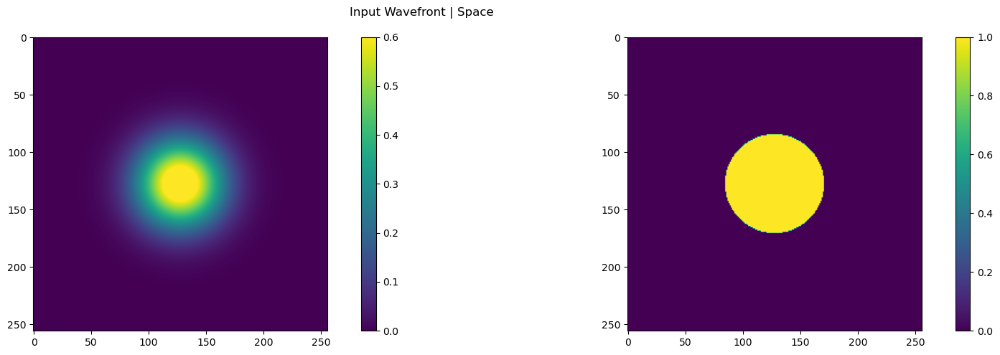

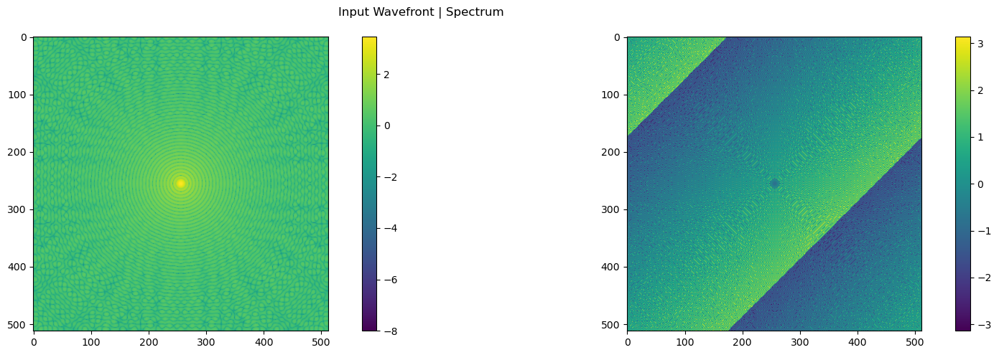

In [5]:
# confrim if the wave in input correctly in the object and viusalize the fourier

gauss_obj = Wave2d(
    numPx = numPx, 
    sizePx = sizePx, 
    wl = wl
    )

gauss_obj.wavefield(gaussian_field)

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
cp_amp = axs[0].imshow((np.abs(gauss_obj.wavefield_z0)), vmax=0.6, vmin=0)
cp_ang = axs[1].imshow((np.angle(gauss_obj.wavefield_z0)))

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle('Input Wavefront | Space')
plt.show()

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
cp_amp = axs[0].imshow(np.log10(np.abs(gauss_obj.fft_wave_z0) + 1e-8))
cp_ang = axs[1].imshow((np.angle(gauss_obj.fft_wave_z0)))

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle('Input Wavefront | Spectrum')
plt.show()

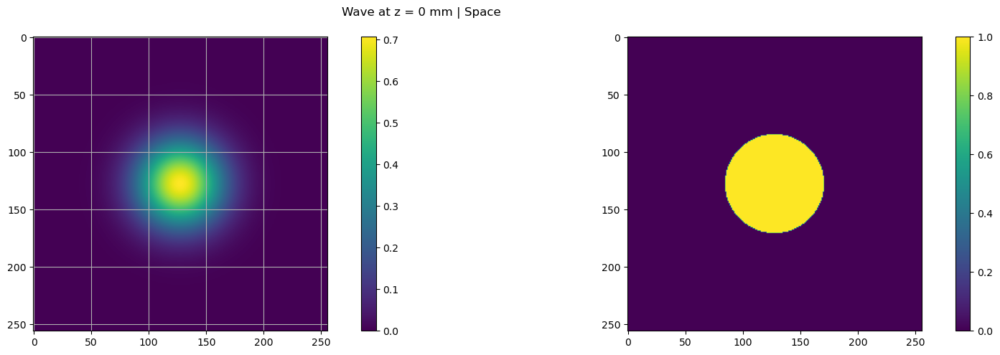

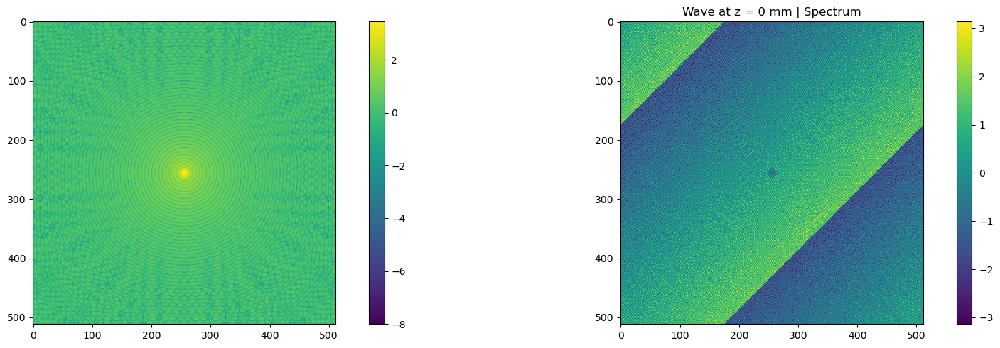

In [6]:
# propagate for the heck of it?

dist = 0 # mm

wave_z = gauss_obj.propogate(dist)

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)

# cp_amp = axs[0].imshow(np.clip(np.log10(np.abs(wave_z)), -7, 1))
cp_amp = axs[0].imshow(np.abs(wave_z))
cp_ang = axs[1].imshow(((np.angle(wave_z))), 
                    #    cmap='twilight'
                       )
axs[0].grid()
fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle(f'Wave at z = {dist} mm | Space')
plt.show()

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
cp_amp = axs[0].imshow(np.log10(np.abs(gauss_obj.fft_wave_z1) + 1e-8))
cp_ang = axs[1].imshow(np.angle(gauss_obj.fft_wave_z1), 
                    #    cmap='twilight'
                       )
# axs[0].ylim([])
fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
plt.title(f'Wave at z = {dist} mm | Spectrum')
plt.show()

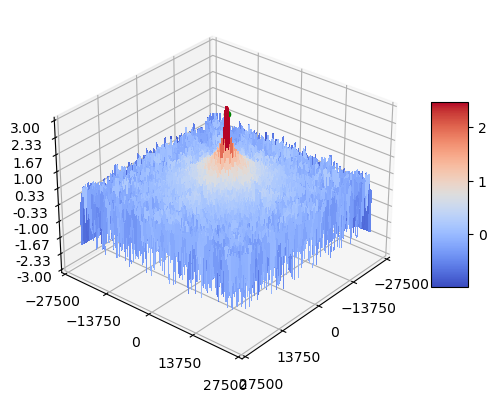

In [7]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

surf = ax.plot_surface(gauss_obj.u, gauss_obj.v, np.clip(np.log10(np.abs(gauss_obj.fft_wave_z1) + 1e-8), -2, 4), cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
# Customize the z axis.
ax.set_zlim(-3, 3)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.xaxis.set_major_locator(LinearLocator(5))
ax.yaxis.set_major_locator(LinearLocator(5))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

ax.scatter(0, 0, zs=3, zdir='z', color='green')

ax.view_init(elev=30, azim=40, roll=0)
plt.show()

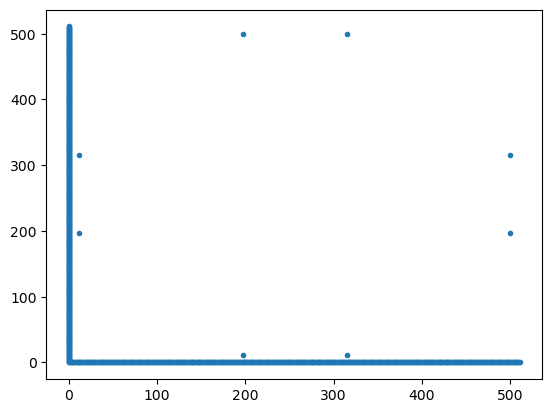

In [8]:
np.argwhere(np.log10(np.abs(gauss_obj.fft_wave_z1) + 1e-8) < -1).shape, gauss_obj.u.size

# zeros on the edges?

plt.plot(np.argwhere(np.log10(np.abs(gauss_obj.fft_wave_z1) + 1e-8) < -4)[:, 0],
         np.argwhere(np.log10(np.abs(gauss_obj.fft_wave_z1) + 1e-8) < -4)[:, 1], '.')

Rotation aroud (X-axis, Y-axis): (0.0, 0.5235987755982988)


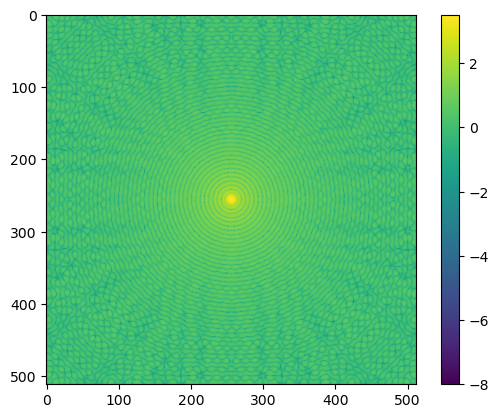

In [611]:
# now let's try rotation around x (phi)

angle = 30

x_rot, y_rot = 0, angle
rot_plane = [(x_rot/180)*np.pi, (y_rot/180)*np.pi]
freqX, freqY, J = gauss_obj.obliquePlaneFreqs(rot_plane)
Z = gauss_obj.fft_wave_z1*np.abs(J)
plt.imshow(np.log10(np.abs(Z) + 1e-8))
plt.colorbar()
plt.show()

## nothing really changes or does it?

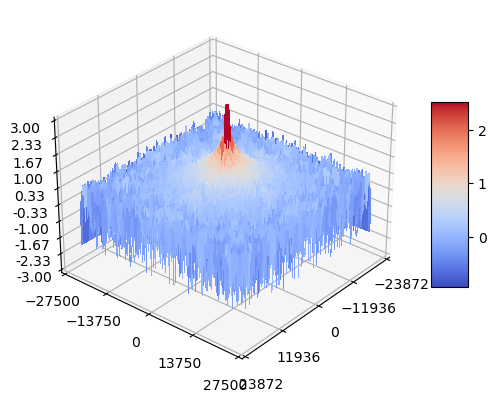

In [612]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

surf = ax.plot_surface(freqX - (freqX.min() + freqX.max())/2, freqY, np.clip(np.log10(np.abs(Z) + 1e-8), -2, 4), cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
# Customize the z axis.
ax.set_zlim(-3, 3)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.xaxis.set_major_locator(LinearLocator(5))
ax.yaxis.set_major_locator(LinearLocator(5))

# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

# ax.scatter((freqX.min() + freqX.max())/2, 0, zs=3, zdir='z', color='green')

ax.view_init(elev=30, azim=40, roll=0)
plt.show()

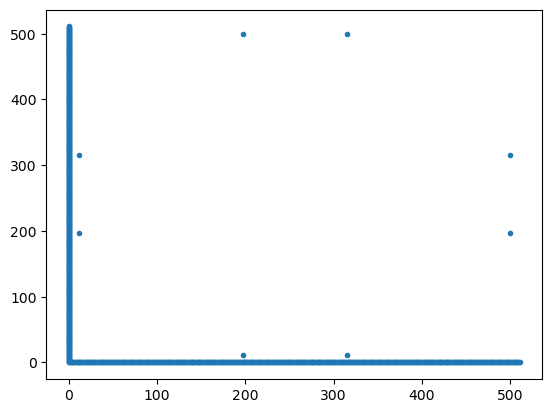

In [613]:
# zeros on the edges?

plt.plot(np.argwhere(np.log10(np.abs(Z) + 1e-8) < -4)[:, 0],
         np.argwhere(np.log10(np.abs(Z) + 1e-8) < -4)[:, 1], '.')

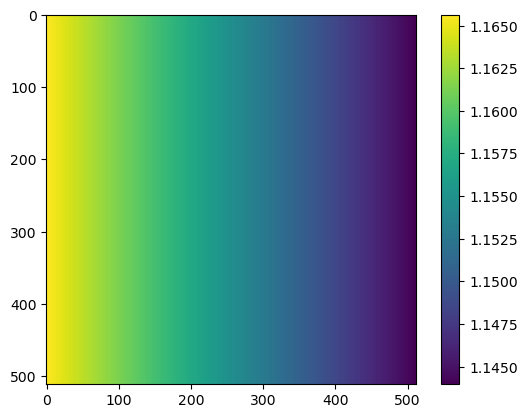

In [614]:
# jacobian
# presence of Jacobian does not increase zeros

plt.imshow(np.abs(J))
plt.colorbar()

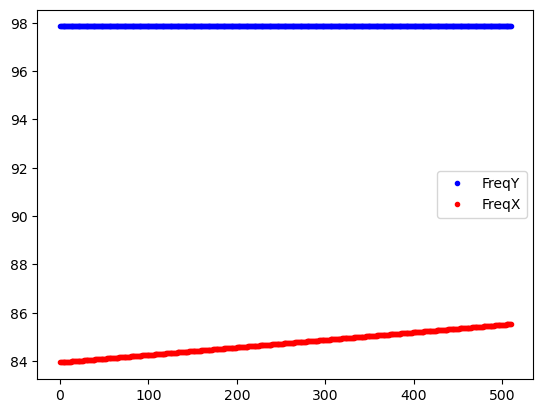

In [615]:
# change in frequencies across x and y with
# rotation aroung y, so no changes in FreqY
# as the FreqY grid is still uniform. However,
# FreqX grid is not uniform as the change in
# freq is reducing. Hence need to interpolate
# the grid by using the smallest change in freq
# as the diff across all adject nodes in specturm.

dist = 0 # mm

diff_y = []
for i in range(len(freqY[:, 256]) - 1):
    diff_y.append(freqY[i+1, 256] - freqY[i, 256])

plt.plot(diff_y, 'b.', label='FreqY')
# plt.show()

diff = []
for i in range(len(freqX[256, :]) - 1):
    diff.append(freqX[256, i+1] - freqX[256, i])

plt.plot(diff, 'r.', label='FreqX')

plt.legend()

In [616]:
freqY.shape, freqX.shape

((512, 512), (512, 512))

In [617]:
from scipy.interpolate import NearestNDInterpolator
from scipy.interpolate import griddata
from scipy.interpolate import SmoothBivariateSpline

In [618]:
# def func(x, y):
#     return x*(1-x)*np.cos(4*np.pi*x) * np.sin(4*np.pi*y**2)**2

# grid_x, grid_y = np.mgrid[0:1:100j, 0:1:200j]

# rng = np.random.default_rng()
# points = rng.random((1000, 2))
# values = func(points[:,0], points[:,1])

# grid_z2 = griddata(points, values, (grid_x, grid_y), method='cubic')
# points.shape, values.shape, grid_x.shape, grid_y.shape

In [631]:
x = freqX.ravel() - (freqX.min() + freqX.max())/2
y = freqY.ravel()

xy = np.c_[x, y]   # or just list(zip(x, y))

# lut2 = LinearNDInterpolator(xy, z)
# lut_amp = CloughTocher2DInterpolator(xy, np.abs(Z.ravel()))
# lut_ang = CloughTocher2DInterpolator(xy, (np.angle(Z.ravel())))

# lut_amp = CloughTocher2DInterpolator(xy, Z.ravel().real)
# lut_ang = CloughTocher2DInterpolator(xy, Z.ravel().imag)

# lut_wave = CloughTocher2DInterpolator(xy, Z.ravel())
# lut_wave = NearestNDInterpolator(xy, Z.ravel(), rescale=True)
# lut_wave = SmoothBivariateSpline(x, y, Z.ravel())

base_diff = freqY[11, 256] - freqY[10, 256]
# np.max(diff)
step_y =  int((max(y) - min(y))/base_diff)
step = int((max(x) - min(x))/base_diff) # can also use max, or w/o rotation as that del is always higher than rotation dels
XX = np.linspace(min(x), max(x), step)
YY = np.linspace(min(y), max(y), step_y)
# freqY.shape[0]*1
# Y = np.linspace(min(y), max(y), step)
# X, Y = np.meshgrid(XX, freqY[:, 0])
X, Y = np.meshgrid(XX, YY)

wave_fft_inter = griddata(xy, Z.ravel(), (X, Y), method='nearest')
# wave_fft_inter = lut_wave(XX, YY)

In [632]:
X.shape, Y.shape

((511, 443), (511, 443))

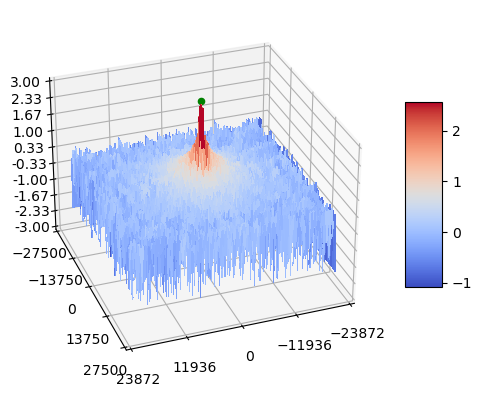

In [633]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

surf = ax.plot_surface(X, Y, np.clip(np.log10(np.abs(wave_fft_inter) + 1e-8), -2, 4), cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
# Customize the z axis.
ax.set_zlim(-3, 3)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.xaxis.set_major_locator(LinearLocator(5))
ax.yaxis.set_major_locator(LinearLocator(5))

# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

ax.scatter(0, 0, zs=3.5, zdir='z', color='green')

ax.view_init(elev=30, azim=70, roll=0)
plt.show()

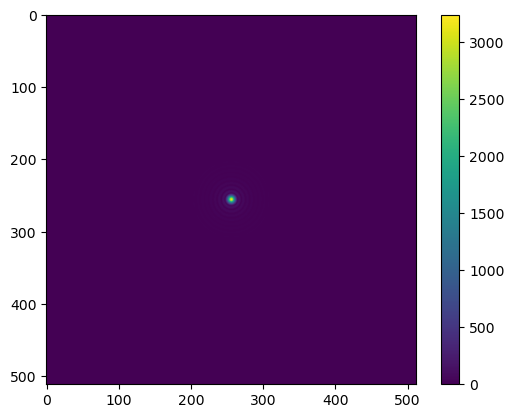

In [634]:
plt.imshow(np.abs(Z))
plt.colorbar()

(511, 443)

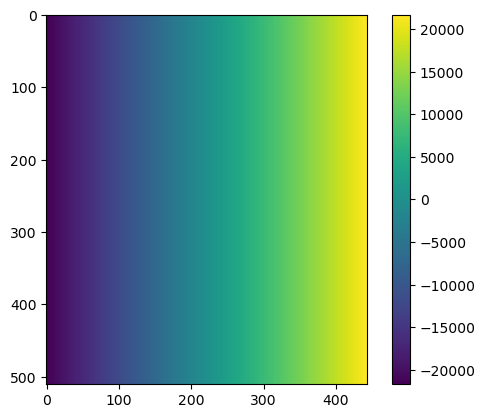

In [635]:
plt.imshow(X)
plt.colorbar()
X.shape

C:\Users\Kazim\AppData\Local\Temp\ipykernel_21972\2503146522.py:4: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(np.abs(wave_fft_inter)))


0


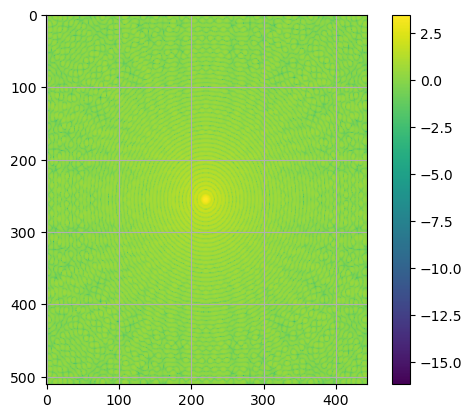

0


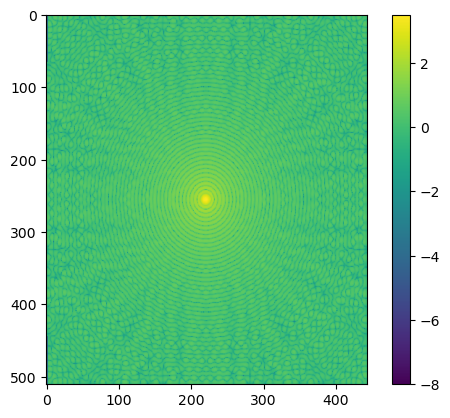

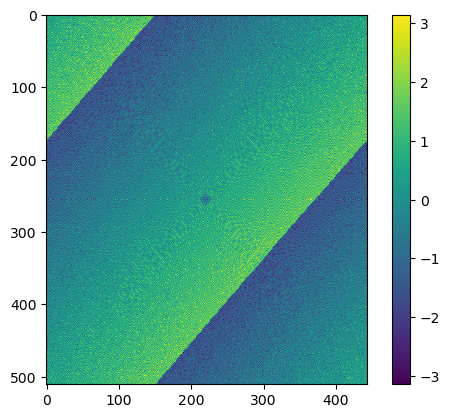

In [636]:
# wave_fft_inter = lut_wave(X, Y)
# [20:-40, 44:-16]
# wave_fft_inter_amp = (wave_fft_inter_amp - np.min(wave_fft_inter_amp) + 1e-7)/
plt.imshow(np.log10(np.abs(wave_fft_inter)))
plt.colorbar()
print(np.isnan(wave_fft_inter).sum())
plt.grid()
plt.show()

# filter = np.zeros_like(wave_fft_inter)
# filter[220:-220, 100:-100]= 1.

# Calculating the Euclidean distance 'd' from the origin using the generated grids 'x' and 'y'
d = np.sqrt(X*X + Y*Y)

# Defining parameters sigma and mu for a Gaussian-like distribution
sigma, mu = 150.0, 0.0

# Calculating the Gaussian-like distribution 'g' based on the distance 'd', sigma, and mu
g_int = np.exp(-((d - mu)**2 / (2.0 * sigma**2)))

# wave_fft_inter =  wave_fft_inter*g_int**2
plt.imshow(np.log10(np.abs(wave_fft_inter) + 1e-8))
plt.colorbar()
print(np.isnan(wave_fft_inter).sum())
plt.show()

plt.imshow((np.angle(wave_fft_inter)))
plt.colorbar()
plt.show()

(array([], shape=(0, 2), dtype=int64), (511, 443))

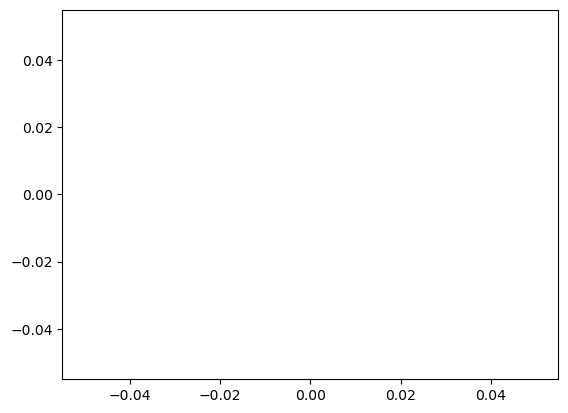

In [637]:
plt.plot(np.argwhere(np.isnan(wave_fft_inter[:, :-7]))[:, 0], 
         np.argwhere(np.isnan(wave_fft_inter[:, :-7]))[:, 1], '.')

np.argwhere(np.isnan(wave_fft_inter[4:-2, 4:-2])), wave_fft_inter.shape

In [638]:
# wave_fft_inter_amp = lut_amp(X, Y)
# # [20:-40, 44:-16]
# # wave_fft_inter_amp = (wave_fft_inter_amp - np.min(wave_fft_inter_amp) + 1e-7)/
# plt.imshow(np.log10(wave_fft_inter_amp))
# plt.grid()
# plt.colorbar()
# np.isnan(wave_fft_inter_amp).sum()

In [639]:
# wave_fft_inter_ang = lut_ang(X, Y)
# # [30:-30, 40:-20]
# plt.imshow(wave_fft_inter_ang)
# plt.grid()
# plt.colorbar()
# np.isnan(wave_fft_inter_ang[20:-20, 20:-20]).sum()

In [640]:
# wave_fft_inter_amp_conv = convolve2d(wave_fft_inter_amp, np.ones([5, 5]), mode='same', boundary='symm')[20:-20, 20:-20]
# plt.imshow(np.log10(wave_fft_inter_amp_conv))
# plt.colorbar()

In [641]:
# x_plane.shape, y_plane.shape, wave_rot_plane.shape
# wave_fft_inter_2 = lut_amp(X, Y) + 1j*lut_ang(X, Y)

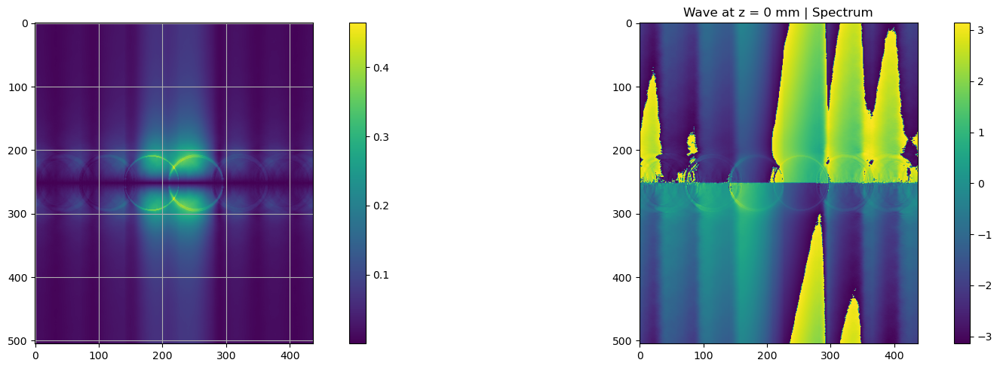

In [642]:
# plt.imshow((np.abs(np.fft.ifft2(np.fft.fftshift(wave_fft_inter_amp*np.exp(1j*wave_fft_inter_ang)))))[100:400, 100:400])
# #         #    [750:1250, 750:1250])

# plt.colorbar()

# wave_rot_plane = np.fft.ifft2(np.fft.fftshift(wave_fft_inter_amp*np.exp(1j*wave_fft_inter_ang)))
wave_rot_plane = (np.fft.ifft2(np.fft.ifftshift(wave_fft_inter[4:-2, 4:-2])))
# wave_rot_plane = np.fft.ifft2(np.fft.ifftshift(wave_fft_inter_amp[4:-2, 4:-2]*np.exp(1j*np.angle(wave_fft_inter[4:-2, 4:-2]))))


# [500:1550, 700:2200]

# plt.imshow(np.abs(wave_rot_plane))

dimX, dimY = wave_rot_plane.shape

x_plane , y_plane = np.linspace(-1*numPx[0]*sizePx[0]/2, numPx[0]*sizePx[0]/2, 256), np.linspace(-1*numPx[1]*sizePx[1]/2, numPx[1]*sizePx[1]/2, 256)
XX_plane, YY_plane = np.meshgrid(x_plane, y_plane)
freq_shift_term = 2*np.pi*XX_plane*(freqX.min() + freqX.max())/2

# wave_rot_plane = wave_rot_plane[:int(dimX/2), -128 + int(dimY/2):128 + int(dimY/2)]*np.exp(1j*XX_plane)
# wave_rot_plane = wave_rot_plane[:251, :251]
# *np.exp(1j*XX_plane)[:251, :251]

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
cp_amp = axs[0].imshow(np.clip(np.abs(wave_rot_plane), 0.0, 0.7))
# cp_amp = axs[0].imshow(np.fft.ifftshift(np.clip(np.abs(np.fft.ifft2(np.fft.ifftshift(wave_fft_inter_amp[4:-2, 4:-2])))**2, 0.0, 1)))
# cp_amp = axs[0].imshow(np.clip(np.log10(np.abs(wave_rot_plane)), -7, 1))
# [:500, :500])
cp_ang = axs[1].imshow(np.angle(wave_rot_plane)
                     #   [:500, :500], 
                    #    cmap='twilight'
                       )
axs[0].grid()
# axs[0].ylim([])
fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
plt.title(f'Wave at z = {dist} mm | Spectrum')
plt.show()

In [520]:
dimX, dimY

(505, 251)

C:\Users\Kazim\AppData\Local\Temp\ipykernel_21972\1431546499.py:3: RuntimeWarning: divide by zero encountered in log10
  surf = ax.plot_surface(X, Y, np.log10(np.abs(wave_fft_inter)), cmap=cm.coolwarm,


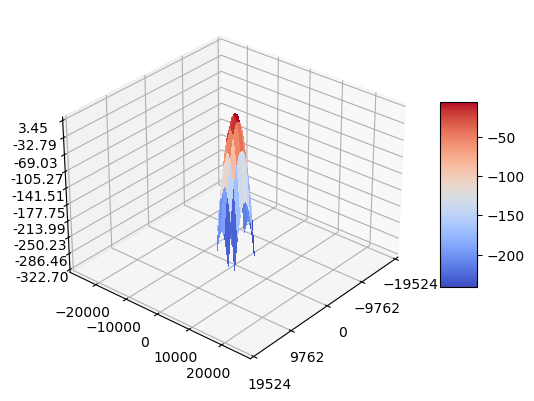

In [418]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

surf = ax.plot_surface(X, Y, np.log10(np.abs(wave_fft_inter)), cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
# Customize the z axis.
# ax.set_zlim(-3, 3)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.xaxis.set_major_locator(LinearLocator(5))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

# ax.scatter((freqX.min() + freqX.max())/2, 0, zs=3, zdir='z', color='green')

ax.view_init(elev=30, azim=40, roll=0)
plt.show()

In [661]:
kx.shape, scaled_kx.shape

((1000,), (1000,))

C:\Users\Kazim\AppData\Local\Temp\ipykernel_21972\1274401875.py:33: DeprecationWarning: `interp2d` is deprecated!
`interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://gist.github.com/ev-br/8544371b40f414b7eaf3fe6217209bff`

  f_interp = interp2d(scaled_kx, scaled_ky, ft_original_beam, kind='quintic')
C:\Users\Kazim\AppData\Local\Temp\ipykernel_21972\1274401875.py:34: DeprecationWarning:         `interp2d` is deprecated!
        `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.12.0.

        For legacy code, nearly bug-for-bug compatible replacements are
        `RectBivariateSpline` on regular grids, and `bispl

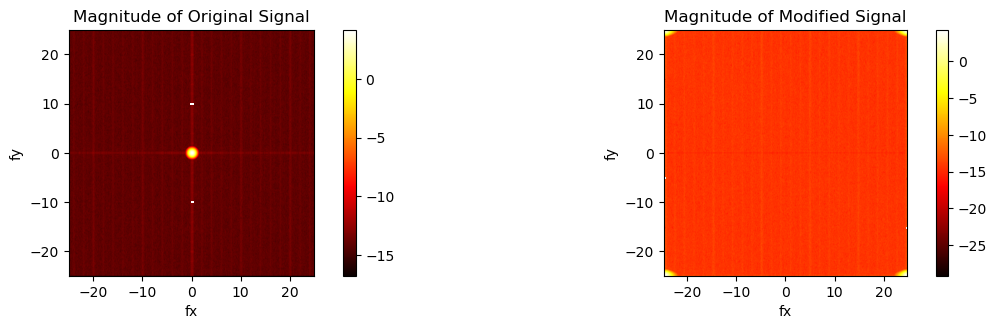

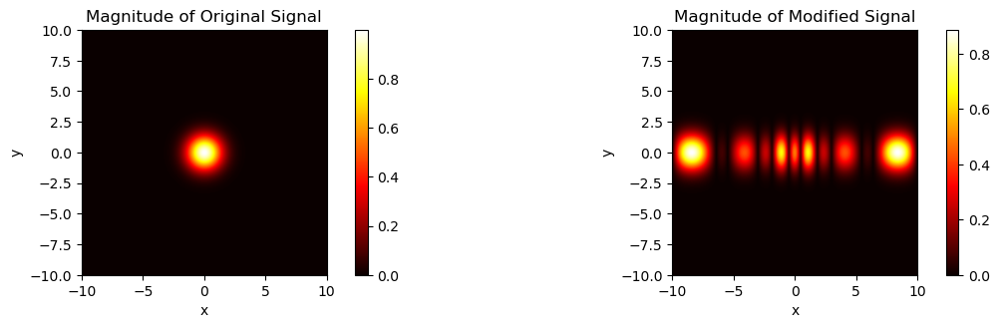

In [695]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp2d

# Define Gaussian beam function
def gaussian_beam(x, y, sigma):
    return np.exp(-(x**2 + y**2) / (2 * sigma**2))

# Define parameters
N = 1000  # Grid size
L = 10    # Spatial domain range
sigma = 1 # Standard deviation of Gaussian

# Create spatial grid
x = np.linspace(-L, L, N)
y = np.linspace(-L, L, N)
X, Y = np.meshgrid(x, y)

# Calculate original Gaussian beam
original_beam = gaussian_beam(X, Y, sigma)

# Calculate Fourier transform of the original beam
ft_original_beam = np.fft.fftshift(np.fft.fft2(original_beam))

# Scale the frequency axis to represent a smaller range of frequencies
kx = np.fft.fftfreq(N, d=2*L/N)
ky = np.fft.fftfreq(N, d=2*L/N)
scale_factor = 1.01  # Scale factor for the frequency axis
scaled_kx = kx / scale_factor
scaled_ky = ky

# Interpolate the Fourier transform to fit the new frequency axis
f_interp = interp2d(scaled_kx, scaled_ky, ft_original_beam, kind='quintic')
ft_scaled_beam = f_interp(kx, ky)

# filer scaled beam
d = np.sqrt(X*X + Y*Y)
sigma, mu = 1., 0.0
g_int = np.exp(-((d - mu)**2 / (2.0 * sigma**2)))
ft_scaled_beam = ft_scaled_beam

# Take inverse Fourier transform to obtain the modified spatial domain signal
modified_beam = np.fft.ifft2(np.fft.ifftshift(ft_scaled_beam))

# Plot original and modified Gaussian beams spectra
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.imshow(np.log10(np.abs(ft_original_beam)), extent=(kx.min(), kx.max(), ky.min(), ky.max()), cmap='hot', origin='lower')
plt.title('Magnitude of Original Signal')
plt.xlabel('fx')
plt.ylabel('fy')
plt.colorbar()

plt.subplot(2, 2, 2)
plt.imshow(np.log10(np.abs(ft_scaled_beam)), extent=(scaled_kx.min(), scaled_kx.max(), scaled_ky.min(), scaled_ky.max()), cmap='hot', origin='lower')
plt.title('Magnitude of Modified Signal')
plt.xlabel('fx')
plt.ylabel('fy')
plt.colorbar()

plt.tight_layout()
plt.show()


# Plot original and modified Gaussian beams
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.imshow(np.abs(original_beam), extent=(-L, L, -L, L), cmap='hot', origin='lower')
plt.title('Magnitude of Original Signal')
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar()

plt.subplot(2, 2, 2)
plt.imshow(np.abs(modified_beam), extent=(-L, L, -L, L), cmap='hot', origin='lower')
plt.title('Magnitude of Modified Signal')
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar()

plt.tight_layout()
plt.show()


## Simulating GT

Translate by +/- 1.2800000000000002 at distance 0


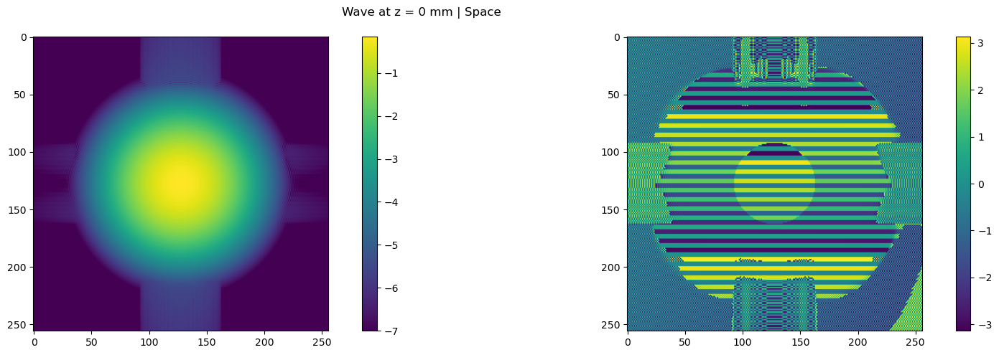

In [135]:
## GT simulation
rot_x = angle
# dist = -39
# translation = np.tan(rot_x/180 * np.pi)*3.354 # mm
translation = np.cos(rot_x/180 * np.pi)*numPx[0]*sizePx[0]/2 # mm

print(f'Translate by +/- {translation} at distance {dist}')

# divide y axis into 260 steps === hstack 100 times with height 1040/260
steps = 64
wave_z_obl = []
for ind, dist2 in enumerate(np.linspace(dist + translation , dist - translation, steps)):
    # print(dist2)
    wave_z_2 = gauss_obj.propogate(dist2)
    wave_z_obl.append(wave_z_2[4*ind:4*(ind+1), :])


wave_z_obl = np.vstack(np.array(wave_z_obl))

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
# cp_amp = axs[0].imshow(np.abs(wave_z)**2)
cp_amp = axs[0].imshow(np.clip(np.log10(np.abs(wave_z_obl)), -7, 2))
cp_ang = axs[1].imshow(((np.angle(wave_z_obl))),
                        # cmap='twilight'
                        )

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle(f'Wave at z = {dist} mm | Space')
plt.show()

In [26]:
print(wave_z_2.shape), print(len(wave_z_obl[1]))

(256, 256)
256


(None, None)

In [27]:
temp_amp = lut_amp(X, Y)
temp_amp_filt = convolve2d(temp_amp, np.ones([5, 5]), mode='same', boundary='symm')
temp_amp[np.isnan(temp_amp)] = temp_amp_filt[np.isnan(temp_amp)]

In [28]:
np.isnan(lut_amp(X, Y)[20:-20, 20:-20]).sum()

0

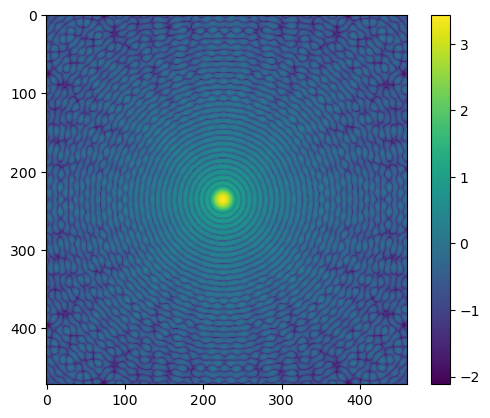

In [29]:
plt.imshow(np.log10(temp_amp[20:-20, 20:-20] + 1e-2))
plt.colorbar()

C:\Users\Kazim\AppData\Local\Temp\ipykernel_19092\1434363427.py:3: RuntimeWarning: invalid value encountered in log10
  surf = ax.plot_surface(X[20:-20, 20:-20], Y[20:-20, 20:-20], np.clip(np.log10(temp_amp[20:-20, 20:-20]), -1, 3), cmap=cm.coolwarm,


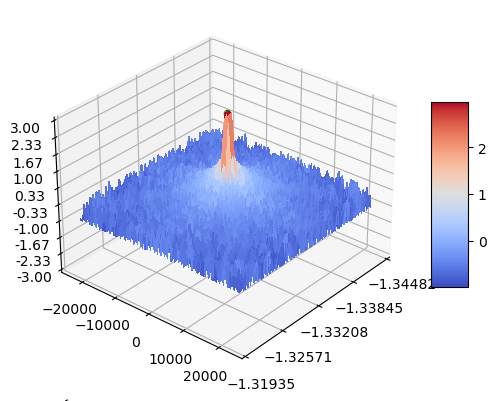

In [30]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

surf = ax.plot_surface(X[20:-20, 20:-20], Y[20:-20, 20:-20], np.clip(np.log10(temp_amp[20:-20, 20:-20]), -1, 3), cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
# Customize the z axis.
ax.set_zlim(-3, 3)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.xaxis.set_major_locator(LinearLocator(5))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

ax.scatter((freqX.min() + freqX.max())/2, 0, zs=3, zdir='z', color='green')

ax.view_init(elev=30, azim=40, roll=0)
plt.show()

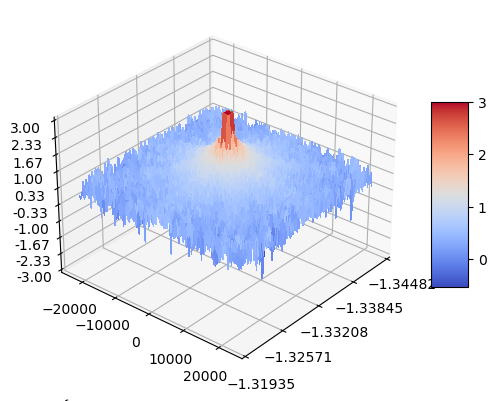

In [31]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

amp_filt = convolve2d(lut_amp(X, Y), np.ones([3, 3]), mode='same', boundary='symm')[20:-20, 20:-20]


surf = ax.plot_surface(X[20:-20, 20:-20], Y[20:-20, 20:-20], np.clip(np.log10(amp_filt + 1e-8), -1, 3), cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
# Customize the z axis.
ax.set_zlim(-3, 3)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.xaxis.set_major_locator(LinearLocator(5))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

ax.scatter((freqX.min() + freqX.max())/2, 0, zs=3, zdir='z', color='green')

ax.view_init(elev=30, azim=40, roll=0)
plt.show()

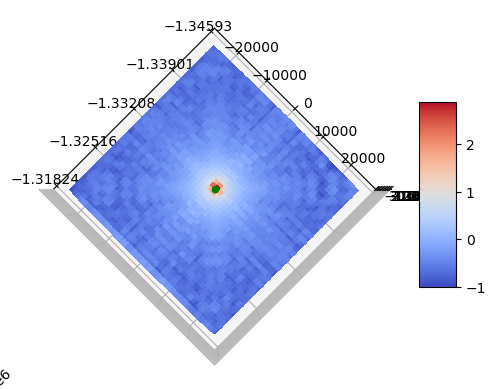

In [32]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

surf = ax.plot_surface(X, Y, np.clip(np.log10(np.abs(lut_amp(X, Y) + 1e-8)), -1, 3), cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
# Customize the z axis.
ax.set_zlim(-3, 3)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.xaxis.set_major_locator(LinearLocator(5))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

ax.scatter((freqX.min() + freqX.max())/2, 0, zs=3, zdir='z', color='green')

ax.view_init(elev=90, azim=40, roll=0)
plt.show()

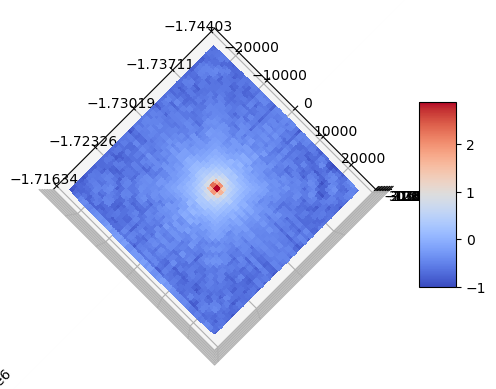

In [33]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

surf = ax.plot_surface(X - 398104, Y, np.clip(np.log10(np.abs(lut_amp(X, Y) + 1e-8)), -1, 3), cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
# Customize the z axis.
ax.set_zlim(-3, 3)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.xaxis.set_major_locator(LinearLocator(5))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

# ax.scatter((freqX.min() + freqX.max())/2, 0, zs=3, zdir='z', color='green')

ax.view_init(elev=90, azim=40, roll=0)
plt.show()

In [34]:
# Wave_fft_rot_inter = lut_amp(X, Y)*np.exp(1j*lut_ang(X, Y))
amp_filt = convolve2d(lut_amp(X, Y), np.ones([5, 5]), mode='same', boundary='symm')[30:-30, 30:-30]
ang_crop = lut_ang(X, Y)[30:-30, 30:-30]
wave_fft_rot_inter = amp_filt*np.exp(1j*ang_crop)

In [35]:
# np.argwhere(np.isnan(Wave_fft_rot_inter)).size, np.argwhere(np.isnan(lut_amp(X, Y))).size, np.argwhere(np.isnan(lut_ang(X, Y))).size

In [36]:
# np.argwhere(np.isnan(Wave_fft_rot_inter))

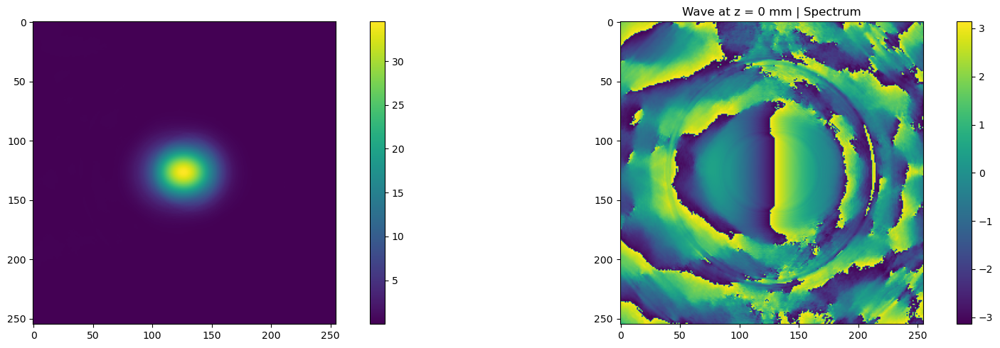

In [37]:
wave_rot_plane = np.fft.ifft2(np.fft.fftshift(wave_fft_rot_inter))
# [500:1550, 700:2200]

# plt.imshow(np.abs(wave_rot_plane))

dimX, dimY = wave_rot_plane.shape
wave_rot_plane = wave_rot_plane[-127 + int(dimX/2):128 + int(dimX/2), -127 + int(dimY/2):128 + int(dimY/2)]

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
cp_amp = axs[0].imshow(np.abs(wave_rot_plane) + 1e-8)
cp_ang = axs[1].imshow(np.angle(wave_rot_plane), 
                    #    cmap='twilight'
                       )
# axs[0].ylim([])
fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
plt.title(f'Wave at z = {dist} mm | Spectrum')
plt.show()

In [38]:
# wave_rot_plane = np.fft.ifft2(np.fft.fftshift(lut_amp(X, Y)[:, :-100]*np.exp(1j*lut_ang(X, Y)[:, :-100])))[500:1550, 700:2200]

# plt.imshow(np.log10(np.abs(wave_rot_plane)))

In [39]:
# wave_rot_plane = np.fft.ifft2(np.fft.fftshift(np.roll(lut_amp(X, Y)[:, :-100], 140, axis=1)[:, 500:]*np.exp(1j*np.roll(lut_ang(X, Y)[:, :-100], 140, axis=1)[:, 500:])))
# # [500:1550, 700:2200]

# plt.imshow((np.abs(wave_rot_plane)))

## Understanding the Change in Frequency Bins and Interpolation to Get Equidistant Grid

NameError: name 'wave_obj' is not defined

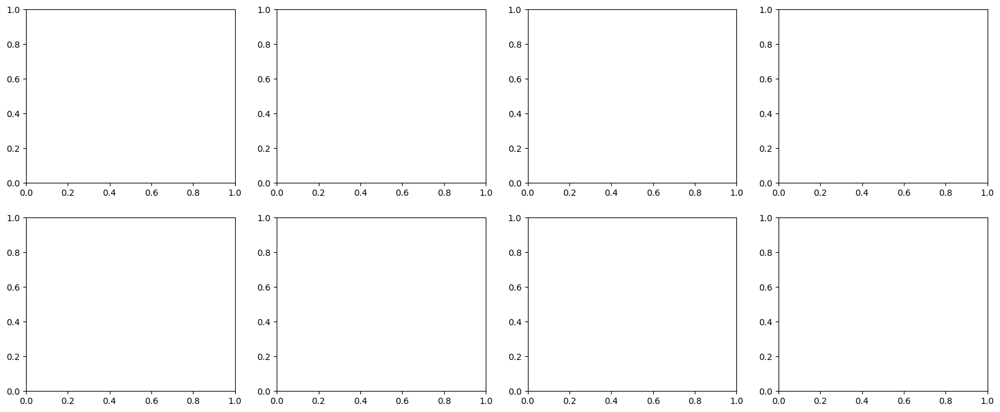

In [40]:
fig, axs = plt.subplots(2, 4, figsize=(20, 8))

for i, angle in enumerate([0, -1, 2, 15]):
    x_rot, y_rot = angle, 0
    rot_plane = [(x_rot/180)*np.pi, (y_rot/180)*np.pi]
    a, b = wave_obj.obliquePlaneFreqs(rot_plane)
    
    print(f'{i}: {np.min(a)}, {b.min()}, {a.max()}, {b.max()}')

    im0 = axs[0, i].imshow(a)
    plt.colorbar(im0, ax=axs[0, i])

    im1 = axs[1, i].imshow(b)
    plt.colorbar(im1, ax=axs[1, i])
plt.show()

Rotation aroud (X-axis, Y-axis): (-0.7853981633974483, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.767944870877505, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.7504915783575618, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.7330382858376184, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.7155849933176751, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.6981317007977318, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.6806784082777886, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.6632251157578453, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.6457718232379019, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.6283185307179586, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.6108652381980153, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.593411945678072, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.5759586531581287, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.5585053606381855, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.5410520681182421, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.5235987755982988, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.50614

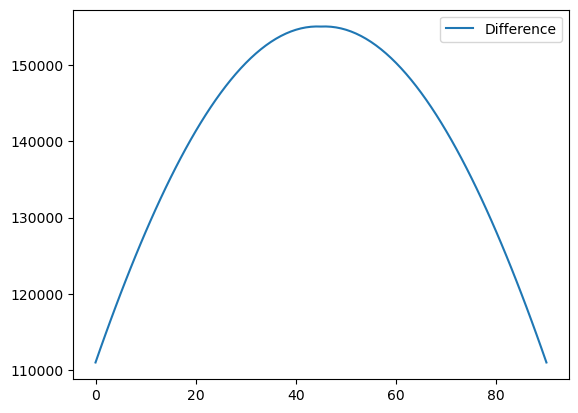

In [ ]:
ang_freq_max = []
ang_freq_min = []

for i, angle in enumerate(np.linspace(-45, 45, 91)):
    x_rot, y_rot = angle, 0
    rot_plane = [(x_rot/180)*np.pi, (y_rot/180)*np.pi]
    a, b = wave_obj.obliquePlaneFreqs(rot_plane)

    ang_freq_max.append(b.max())
    ang_freq_min.append(b.min())

# plt.plot(ang_freq_max, label='Max')
# plt.plot(ang_freq_min, label='Min')
plt.plot(np.array(ang_freq_max) - np.array(ang_freq_min), label='Difference')
plt.legend()

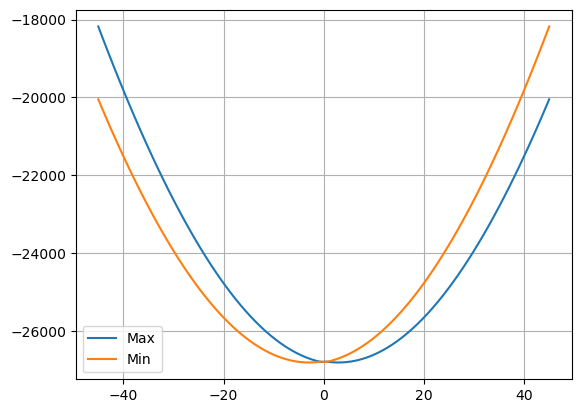

In [ ]:
plt.plot(np.linspace(-45, 45, 90), np.ediff1d(ang_freq_max), label='Max')
plt.plot(np.linspace(-45, 45, 90), np.ediff1d(ang_freq_min), label='Min')
plt.legend()
plt.grid()

Rotation aroud (X-axis, Y-axis): (0.0, 0.0)
Rotation aroud (X-axis, Y-axis): (0.2617993877991494, 0.0)


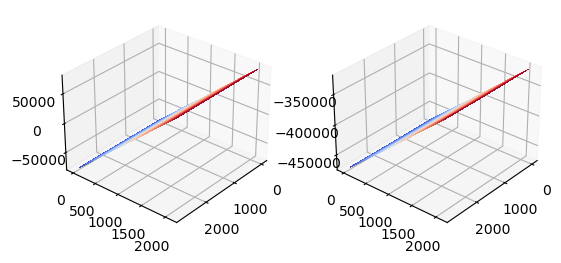

In [ ]:
X = np.arange(0, b.shape[1])
Y = np.arange(0, b.shape[0])
X, Y = np.meshgrid(X, Y)

from matplotlib import cm
fig, ax = plt.subplots(1, 2, subplot_kw={"projection": "3d"})

for i, angle in enumerate([0, 15]):
    x_rot, y_rot = angle, 0
    rot_plane = [(x_rot/180)*np.pi, (y_rot/180)*np.pi]
    a, b = wave_obj.obliquePlaneFreqs(rot_plane)

    ax[i].plot_surface(X, Y, b, cmap=cm.coolwarm,
                        linewidth=0, antialiased=False, label=angle)
    ax[i].view_init(elev=30, azim=40, roll=0)


In [ ]:
# 1- for a single rotation, it seems that the bins are linearly shifted.
# that is, grid for freqs linear spaced stil. (wrong)
# 2- caomparing different rotations, the total frequencies (max - mib) is
# different for diff. rotation angles, with the difference decreasing for
# increasing angles. (correct)

## To-do
# Select min-max angle of rotations and intermediate overlapping freq steps
# Interpolate each frequency patch to match the base (no rotation) since the
# resolution on the base patch was calculated based on the hardware.

# The range of frequencies in the same size fourier plane decreases with 
# increasing rotation. This should suggest that the freq. resolution is
# decreasing.
# If we were to augment the frequency space with unprocessed patches, this
# would mean that we would not have equidistant grid points.
# To retain an equidistant grid, we can reduce the size of torated patch while
# not reducing max/min frequencies captures, hence interpolation. (also why)

((2080, 2784),
 (2080, 2784),
 70822.92324462716,
 -84222.89843814034,
 240.60971481753253,
 dtype('float64'))

In [ ]:
dist = -40 # mm
angle = 3


wave_z = wave_obj.propogate(dist)

x_rot, y_rot = angle, 0
rot_plane = [(x_rot/180)*np.pi, (y_rot/180)*np.pi]
a, b = wave_obj.obliquePlaneFreqs(rot_plane)

wave_fft_offset = np.zeros([2080 + np.abs(int((np.abs(a.min()) - a.max())*2080/(a.max() - a.min()))), 
                            2784 + np.abs(int((np.abs(b.min()) - b.max())*2784/(b.max() - b.min())))], dtype=np.complex128)

wave_fft_offset[np.abs(int((np.abs(a.min()) - a.max())*2080/(a.max() - a.min()))):, 
                np.abs(int((np.abs(b.min()) - b.max())*2784/(b.max() - b.min()))):] = wave_obj.fft_wave_z1

Rotation aroud (X-axis, Y-axis): (0.05235987755982988, 0.0)


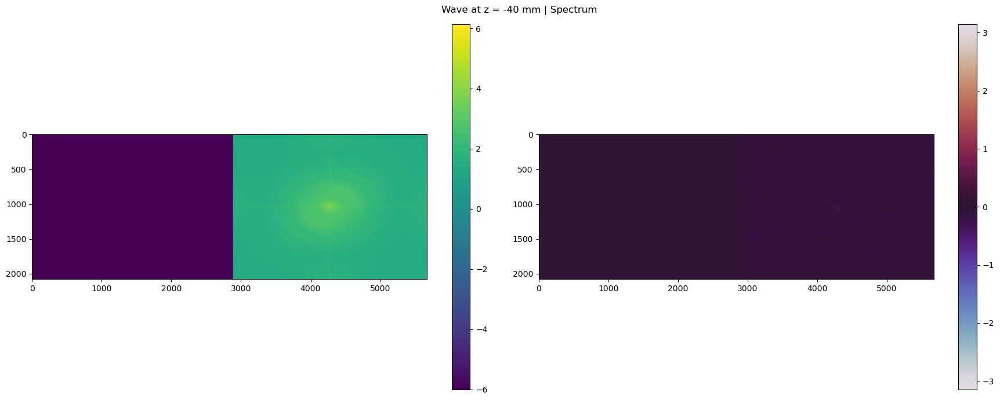

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(18, 7), tight_layout=True)

cp_amp = axs[0].imshow(np.log10(np.abs(wave_fft_offset) + 0.000001), 
                    #    extent=[-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), -1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1])]
                       )

cp_ang = axs[1].imshow(np.angle(wave_fft_offset), cmap='twilight', 
                    #    extent=[-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), -1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1])]
                       )

# axs[0].set_xticks(np.linspace(-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), 6))
# axs[0].set_yticks(np.linspace(-1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1]), 6))

# axs[1].set_xticks(np.linspace(-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), 6))
# axs[1].set_yticks(np.linspace(-1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1]), 6))

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])

fig.suptitle(f'Wave at z = {dist} mm | Spectrum')
plt.show()

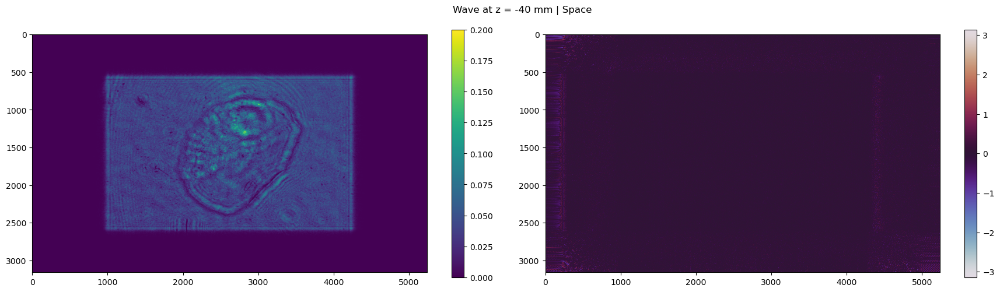

In [ ]:
wave_offset = np.fft.ifft2(np.fft.fftshift(wave_fft_offset))[500:-500, 700:-700]
# [700:-700, 700:-700]

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)

cp_amp = axs[0].imshow(np.clip((np.abs(wave_offset)**2), 0, 4))
cp_ang = axs[1].imshow(((np.angle(wave_offset))), cmap='twilight')

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle(f'Wave at z = {dist} mm | Space')
# plt.tight_layout()
plt.show()

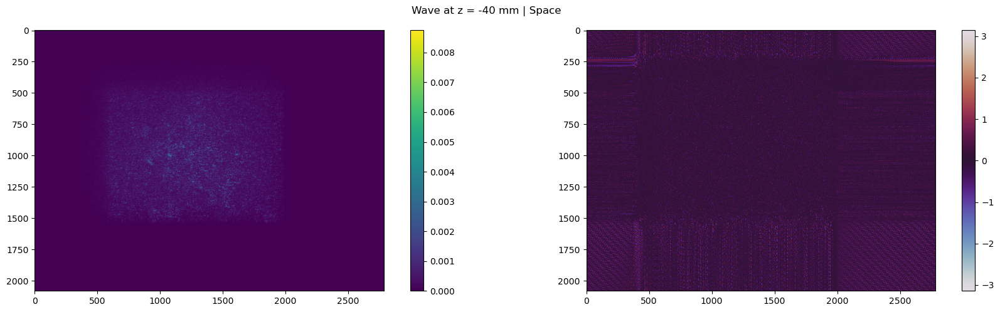

C:\Users\Kazim\AppData\Local\Temp\ipykernel_5768\2819714562.py:23: RuntimeWarning: divide by zero encountered in log10
  cp_amp = axs[0].imshow(np.log10(np.abs(fft_crop)),


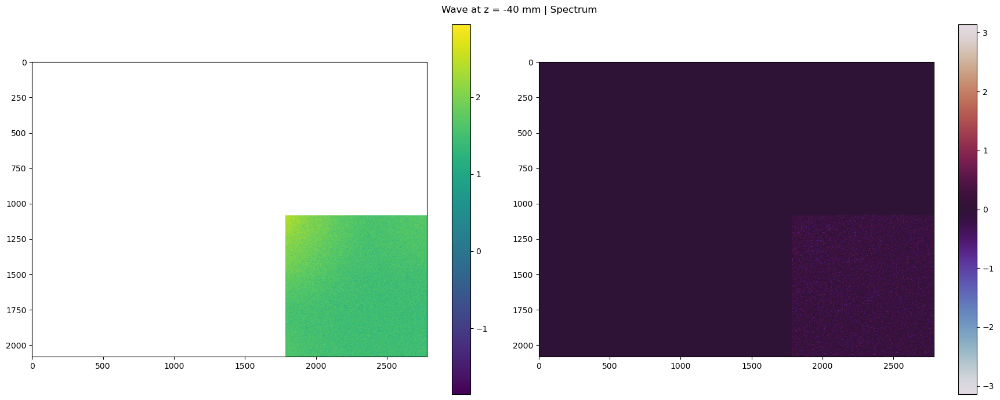

In [ ]:
dist = -40 # mm

wave_z = wave_obj.propogate(dist)

fft_crop = np.zeros_like(wave_obj.fft_wave_z1)
fft_crop[-1000:, -1000:]= wave_obj.fft_wave_z1[-1000:, -1000:]
# fft_crop = wave_obj.fft_wave_z1[-1000:, -1000:]

wave_fft_crop = np.fft.ifft2(np.fft.fftshift(fft_crop))

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)

cp_amp = axs[0].imshow(np.clip((np.abs(wave_fft_crop)**2), 0, 4))
cp_ang = axs[1].imshow(((np.angle(wave_fft_crop))), cmap='twilight')

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle(f'Wave at z = {dist} mm | Space')
plt.show()

fig, axs = plt.subplots(1, 2, figsize=(18, 7), tight_layout=True)

cp_amp = axs[0].imshow(np.log10(np.abs(fft_crop)), 
                    #    extent=[-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), -1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1])]
                       )

cp_ang = axs[1].imshow(np.angle(fft_crop), cmap='twilight', 
                    #    extent=[-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), -1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1])]
                       )

# axs[0].set_xticks(np.linspace(-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), 6))
# axs[0].set_yticks(np.linspace(-1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1]), 6))

# axs[1].set_xticks(np.linspace(-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), 6))
# axs[1].set_yticks(np.linspace(-1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1]), 6))

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])

fig.suptitle(f'Wave at z = {dist} mm | Spectrum')
plt.show()

In [ ]:
for angle in np.linspace(-2, 2, 41):

    x_rot, y_rot = angle, 0
    rot_plane = [(x_rot/180)*np.pi, (y_rot/180)*np.pi]
    a, b = wave_obj.obliquePlaneFreqs(rot_plane)
    # a = np.abs(a)
    a = (a - a.min())/(a.max() - a.min())
    cv2.imshow('Frame', cv2.resize(a, (800, 600)))

    # add waitKey for video to display
    key = cv2.waitKey(1)

    if key == ord('q'):
        # do not close window, you want to show the frame
        cv2.destroyAllWindows()
        break

cv2.destroyAllWindows()

Rotation aroud (X-axis, Y-axis): (-0.03490658503988659, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.03316125578789226, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.031415926535897934, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.029670597283903602, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.027925268031909273, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.02617993877991494, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.024434609527920613, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.02268928027592628, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.020943951023931952, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.019198621771937624, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.017453292519943295, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.015707963267948963, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.013962634015954633, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.012217304763960306, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.010471975511965975, 0.0)
Rotation aroud (X-axis, Y-axis): (-0.008726646259971648, 0.0)
Rotation aro

In [ ]:
wave_obj.u.shape, wave_obj.v.shape

((2080, 2784), (2080, 2784))

In [ ]:
wave_obj.u[:3, :3], wave_obj.v[:3, :3]

(array([[-77519.37984496, -77463.67062481, -77407.96140465],
        [-77519.37984496, -77463.67062481, -77407.96140465],
        [-77519.37984496, -77463.67062481, -77407.96140465]]),
 array([[-77519.37984496, -77519.37984496, -77519.37984496],
        [-77444.80612698, -77444.80612698, -77444.80612698],
        [-77370.23240899, -77370.23240899, -77370.23240899]]))

Rotation aroud (X-axis, Y-axis): (0.17453292519943295, 0.17453292519943295)
-77519.37984496124 77519.37984496124 -343153.3770516858 -190130.22062268484
155038.75968992247 153023.15642900098


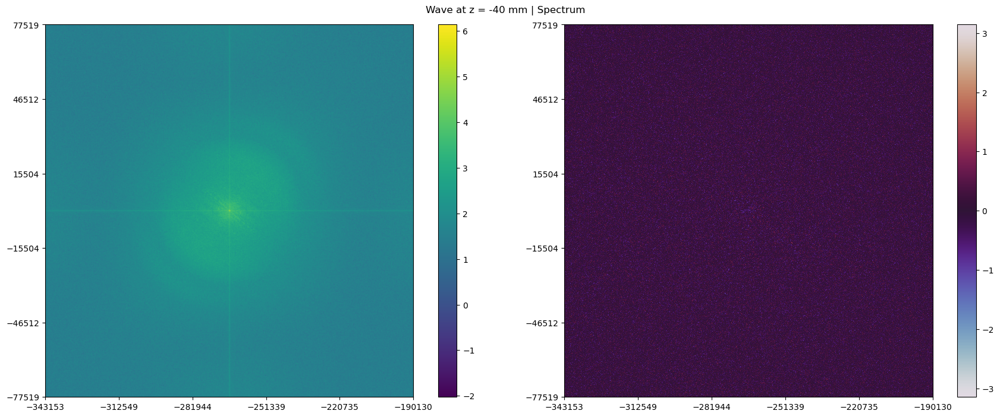

In [ ]:
x_rot, y_rot = 10, 10
rot_plane = [(x_rot/180)*np.pi, (y_rot/180)*np.pi]
[freq_rows_obl, freq_cols_obl] = wave_obj.obliquePlaneFreqs(rot_plane)

print(np.min(freq_rows_obl), np.max(freq_rows_obl), np.min(freq_cols_obl), np.max(freq_cols_obl))
print(np.abs(np.min(freq_rows_obl) - np.max(freq_rows_obl)), np.abs(np.min(freq_cols_obl) - np.max(freq_cols_obl)))

fig, axs = plt.subplots(1, 2, figsize=(18, 7), tight_layout=True)

cp_amp = axs[0].imshow(np.log10(np.abs(wave_obj.fft_wave_z1)), 
                       extent=[np.min(freq_cols_obl), np.max(freq_cols_obl), np.min(freq_rows_obl), np.max(freq_rows_obl)])

cp_ang = axs[1].imshow(np.angle(wave_obj.fft_wave_z1), cmap='twilight', 
                       extent=[np.min(freq_cols_obl), np.max(freq_cols_obl), np.min(freq_rows_obl), np.max(freq_rows_obl)])

axs[0].set_yticks(np.linspace(np.min(freq_rows_obl), np.max(freq_rows_obl), 6))
axs[0].set_xticks(np.linspace(np.min(freq_cols_obl), np.max(freq_cols_obl), 6))

axs[1].set_yticks(np.linspace(np.min(freq_rows_obl), np.max(freq_rows_obl), 6))
axs[1].set_xticks(np.linspace(np.min(freq_cols_obl), np.max(freq_cols_obl), 6))

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])

fig.suptitle(f'Wave at z = {dist} mm | Spectrum')
plt.show()

Rotation aroud (X-axis, Y-axis): (0.17453292519943295, 0.0)
-77519.37984496124 77519.37984496124 -343153.3770516858 -190130.22062268484
155038.75968992247 153023.15642900098


C:\Users\Kazim\AppData\Local\Temp\ipykernel_14872\2189929951.py:9: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  plt.pcolor(freq_cols_obl, freq_rows_obl, np.log10(np.abs(wave_obj.fft_wave_z1)))


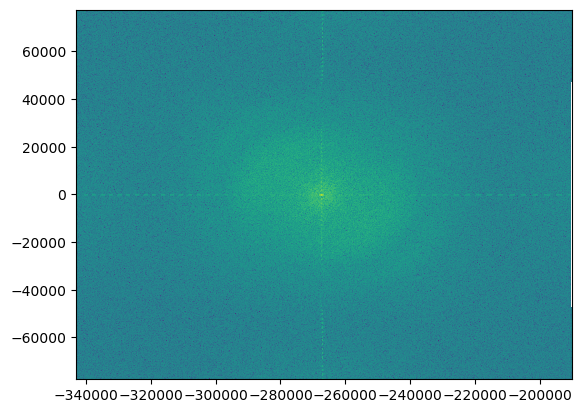

In [ ]:
x_rot, y_rot = 10, 0
rot_plane = [(x_rot/180)*np.pi, (y_rot/180)*np.pi]
[freq_rows_obl, freq_cols_obl] = wave_obj.obliquePlaneFreqs(rot_plane)

print(np.min(freq_rows_obl), np.max(freq_rows_obl), np.min(freq_cols_obl), np.max(freq_cols_obl))
print(np.abs(np.min(freq_rows_obl) - np.max(freq_rows_obl)), np.abs(np.min(freq_cols_obl) - np.max(freq_cols_obl)))


plt.pcolor(freq_cols_obl, freq_rows_obl, np.log10(np.abs(wave_obj.fft_wave_z1)))

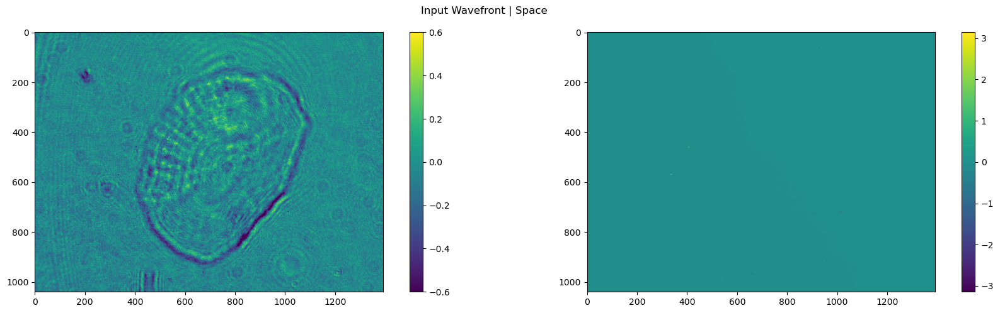

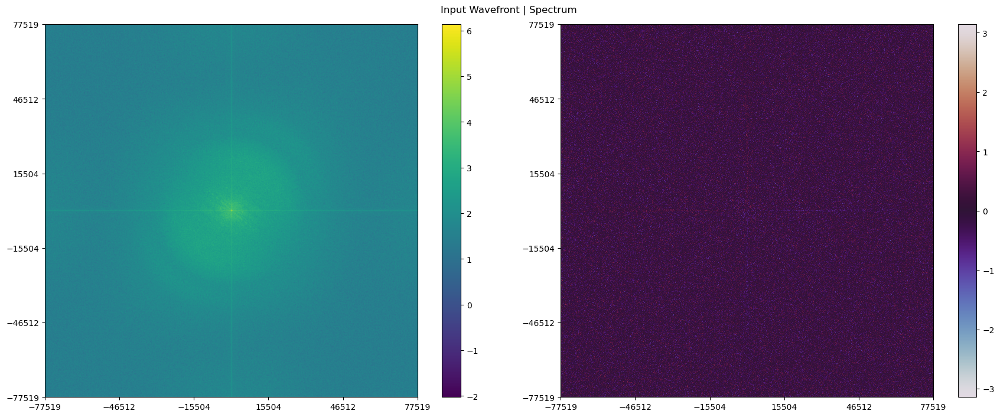

In [ ]:
sample = '05_02'
sample_name = f'samples/2024_01_30_Wolfgangs_Wavefront_Sensor_First_Test/Reconstruction/{sample}.mat'
 
A = np.array(h5py.File(sample_name, 'r').get('A'))
P = np.array(h5py.File(sample_name, 'r').get('phi'))*1e-6

wave_0= A*np.exp(1j*P)
wave_0 = wave_0.T

wave_obj = Wave2d(
    numPx = [1392, 1040], 
    sizePx = [0.00645, 0.00645], 
    wl = 650*1e-6
    # wl = 532.8*1e-6
    )

wave_obj.wavefield(wave_0)

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
cp_amp = axs[0].imshow(np.log10(np.abs(wave_obj.wavefield_z0)), vmax=0.6, vmin=-0.6)
cp_ang = axs[1].imshow((np.angle(wave_obj.wavefield_z0)))

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle('Input Wavefront | Space')
plt.show()

fig, axs = plt.subplots(1, 2, figsize=(18, 7), tight_layout=True)

cp_amp = axs[0].imshow(np.log10(np.abs(wave_obj.fft_wave_z0)), 
                       extent=[np.min(wave_obj.v), np.max(wave_obj.v), np.min(wave_obj.u), np.max(wave_obj.u)])

cp_ang = axs[1].imshow(np.angle(wave_obj.fft_wave_z0), cmap='twilight', 
                       extent=[np.min(wave_obj.v), np.max(wave_obj.v), np.min(wave_obj.u), np.max(wave_obj.u)])

axs[0].set_yticks(np.linspace(np.min(wave_obj.u), np.max(wave_obj.u), 6))
axs[0].set_xticks(np.linspace(np.min(wave_obj.v), np.max(wave_obj.v), 6))

axs[1].set_yticks(np.linspace(np.min(wave_obj.u), np.max(wave_obj.u), 6))
axs[1].set_xticks(np.linspace(np.min(wave_obj.v), np.max(wave_obj.v), 6))

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle('Input Wavefront | Spectrum')
plt.show()

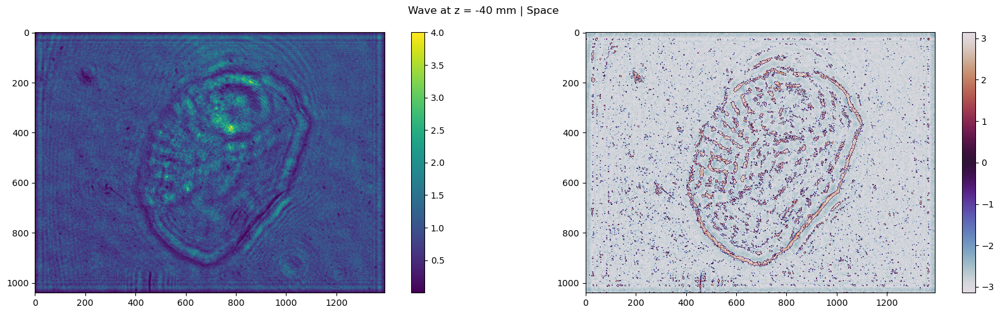

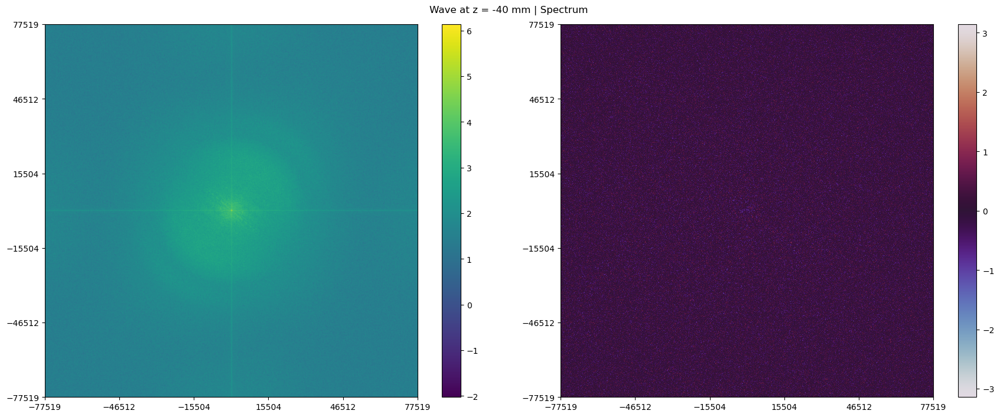

In [ ]:
dist = -40 # mm

wave_z = wave_obj.propogate(dist)

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
# cp_amp = axs[0].imshow(np.abs(wave_z)**2)
cp_amp = axs[0].imshow(np.clip((np.abs(wave_z)**2), 0, 4))
cp_ang = axs[1].imshow(((np.angle(wave_z))), cmap='twilight')

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle(f'Wave at z = {dist} mm | Space')
plt.show()

fig, axs = plt.subplots(1, 2, figsize=(18, 7), tight_layout=True)

cp_amp = axs[0].imshow(np.log10(np.abs(wave_obj.fft_wave_z1)), 
                       extent=[-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), -1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1])])

cp_ang = axs[1].imshow(np.angle(wave_obj.fft_wave_z1), cmap='twilight', 
                       extent=[-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), -1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1])])

axs[0].set_xticks(np.linspace(-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), 6))
axs[0].set_yticks(np.linspace(-1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1]), 6))

axs[1].set_xticks(np.linspace(-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), 6))
axs[1].set_yticks(np.linspace(-1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1]), 6))

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])

fig.suptitle(f'Wave at z = {dist} mm | Spectrum')
plt.show()